# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing Libraries

In [ ]:
import torch
import os
import cv2
import os
import matplotlib.pyplot as plt
import shutil
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from IPython.display import Image, display

# Dataset Details

In [ ]:
import os

# Define the folder path
folder_path = '/content/drive/MyDrive/MLR/S3R2-KIIT'
files = os.listdir(folder_path)

for file in files:
    print(file)

train
valid
test
S3R2_data.yml


In [ ]:
import os

# Define the paths for train, valid, and test directories
base_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT'
dirs = ['train', 'valid', 'test']

for dir_name in dirs:
    dir_path = os.path.join(base_dir, dir_name)
    print(f"\nDirectory: {dir_name}")
    for subfolder in os.listdir(dir_path):
        subfolder_path = os.path.join(dir_path, subfolder)

        if os.path.isdir(subfolder_path):
            num_files = len([f for f in os.listdir(subfolder_path) if os.path.isfile(os.path.join(subfolder_path, f))])
            print(f"  Subfolder: {subfolder}, Number of files: {num_files}")



Directory: train
  Subfolder: images, Number of files: 1360
  Subfolder: labels, Number of files: 1360

Directory: valid
  Subfolder: images, Number of files: 170
  Subfolder: labels, Number of files: 170

Directory: test
  Subfolder: images, Number of files: 170
  Subfolder: labels, Number of files: 170


**We need to change yml file path (ex. train: drive/MyDrive/MLR/S3R2-KIIT/train/images) information according to which location we stored the dataset in our drive.**

In [ ]:
yaml_file_path = '/content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml'
with open(yaml_file_path, 'r') as file:
    yaml_content = file.read()

print(yaml_content)


names:
  - Artilary
  - Missile
  - Radar
  - M. Rocket Launcher
  - Soldier
  - Tank
  - Vehicle
nc: 7
train: /content/drive/MyDrive/MLR/S3R2-KIIT/train/images
val: /content/drive/MyDrive/MLR/S3R2-KIIT/test/images
test: /content/drive/MyDrive/MLR/S3R2-KIIT/valid/images



Let's see the information of a annotation file...

In [ ]:
import os

label_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/test/labels'
label_file = 'image_s3r2_kiit_116.txt'

label_path = os.path.join(label_dir, label_file)

if not os.path.exists(label_path):
    print(f"Label file not found: {label_path}")
else:
    with open(label_path, 'r') as f:
        lines = f.readlines()

    print(f"Label file: {label_file}")
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())

        print(f"Class ID: {int(class_id)}")
        print(f"Bounding Box: x_center={x_center}, y_center={y_center}, width={width}, height={height}")
        print("-" * 50)

Label file: image_s3r2_kiit_116.txt
Class ID: 5
Bounding Box: x_center=0.41594, y_center=0.568333, width=0.35438, height=0.234259
--------------------------------------------------


In [ ]:
# Class names as per our dataset
class_names = [
    "Artilary",             # ID 0
    "Missile",              # ID 1
    "Radar",                # ID 2
    "M. Rocket Launcher",   # ID 3
    "Soldier",              # ID 4
    "Tank",                 # ID 5
    "Vehicle"               # ID 6
]

# Visualization

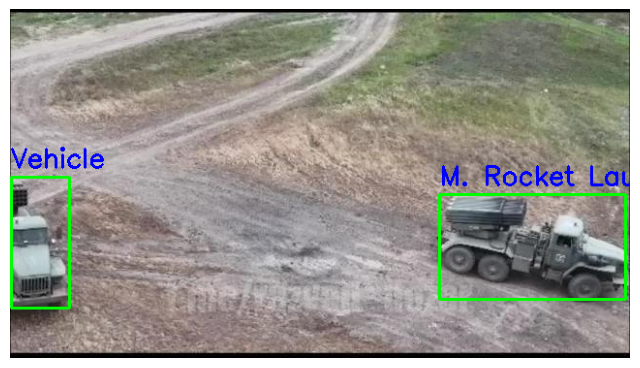

In [ ]:
image_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/test/images'
annotation_dir = '/content/drive/MyDrive/MLR/S3R2-KIIT/test/labels'

def visualize_image_with_annotations(image_name):
    image_path = os.path.join(image_dir, image_name)
    img = cv2.imread(image_path)

    if img is None:
        print(f"Image not found: {image_path}")
        return

    annotation_name = os.path.splitext(image_name)[0] + '.txt'
    annotation_path = os.path.join(annotation_dir, annotation_name)

    if not os.path.exists(annotation_path):
        print(f"Annotation not found: {annotation_path}")
        return

    img_height, img_width = img.shape[:2]

    with open(annotation_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())

        x_center = int(x_center * img_width)
        y_center = int(y_center * img_height)
        width = int(width * img_width)
        height = int(height * img_height)

        x_min = int(x_center - width / 2)
        y_min = int(y_center - height / 2)
        x_max = int(x_center + width / 2)
        y_max = int(y_center + height / 2)

        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=2)

        class_name = class_names[int(class_id)]

        cv2.putText(img, class_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

visualize_image_with_annotations('image_s3r2_kiit_1297.jpeg')  # Image to Visualize


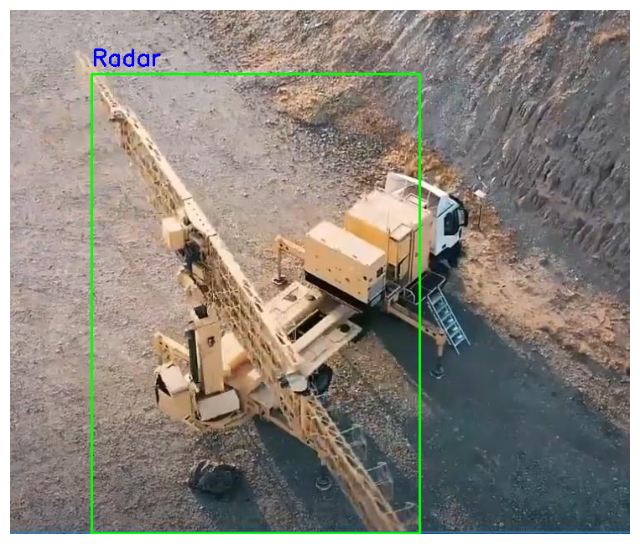

In [ ]:
visualize_image_with_annotations('image_s3r2_kiit_150.jpeg')

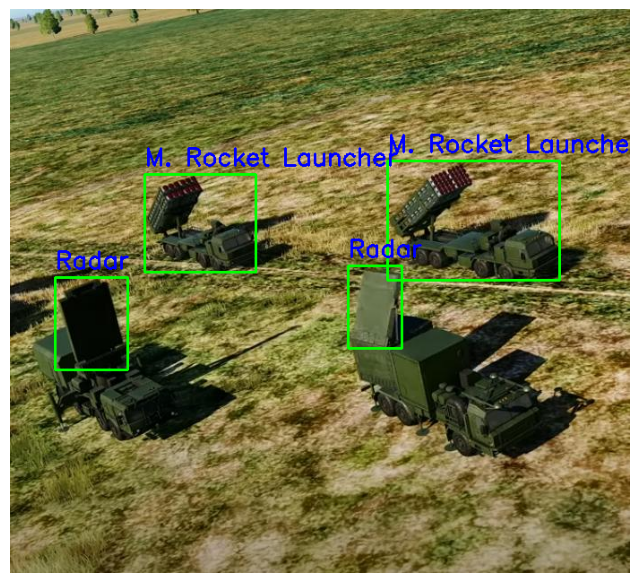

In [ ]:
visualize_image_with_annotations('image_s3r2_kiit_1591.jpeg')

# Cheking for GPU

In [ ]:
if torch.cuda.is_available():
    gpu_info = torch.cuda.get_device_properties(0)
    print(f"GPU is available: {gpu_info.name}")
    print(f"Total Memory: {gpu_info.total_memory / (1024**3):.2f} GB")
    print(f"CUDA Capability: {gpu_info.major}.{gpu_info.minor}")
else:
    print("GPU not available, running on CPU.")


GPU is available: Tesla T4
Total Memory: 14.75 GB
CUDA Capability: 7.5


In [ ]:
!nvidia-smi

Sun Nov  3 18:44:32 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8              12W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Setting up YOLOV8-SMALL...

In [ ]:

!pip install ultralytics==8.2.103 -q

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

from ultralytics import YOLO

from IPython.display import display, Image

Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.3/112.6 GB disk)


Using the YOLOv8_SMALL model

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data=/content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml epochs=100 imgsz=640 plots=True

100% 21.5M/21.5M [00:00<00:00, 37.7MB/s]
New https://pypi.org/project/ultralytics/8.3.27 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/MLR/S3R2-KIIT/S3R2_data.yml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False

# Result Analysis

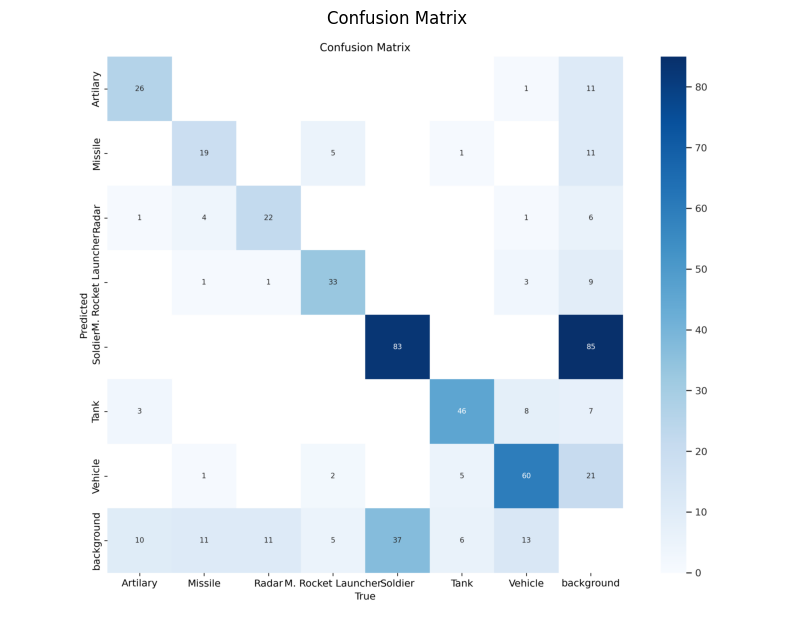

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Path to the confusion matrix image
image_path = '/content/runs/detect/train/confusion_matrix.png'

# Read and display the image
img = mpimg.imread(image_path)
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')  # Hide the axes
plt.title('Confusion Matrix')
plt.show()


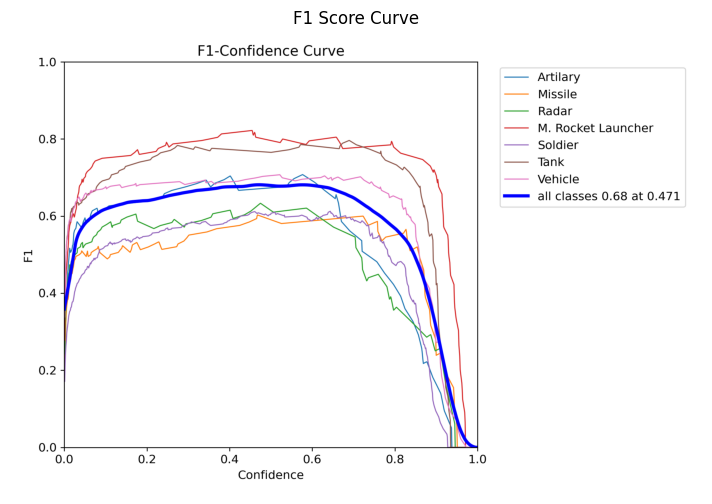

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load and display the F1 curve image
f1_curve_path = '/content/runs/detect/train/F1_curve.png'
img = mpimg.imread(f1_curve_path)

plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.title('F1 Score Curve')
plt.show()


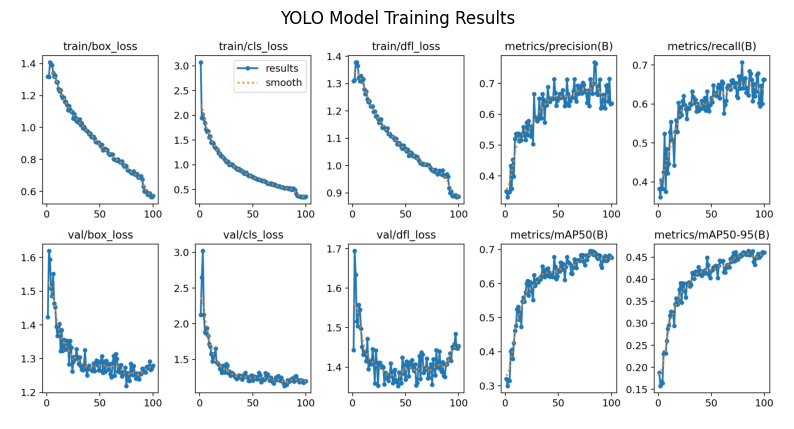

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load and display the results image
results_image_path = '/content/runs/detect/train/results.png'
img = mpimg.imread(results_image_path)

plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.title('YOLO Model Training Results')
plt.show()


# Detection

Single Image Detection

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.40 source=/content/drive/MyDrive/MLR/S3R2-KIIT/valid/images/image_s3r2_kiit_176.jpeg save=True

Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs

image 1/1 /content/drive/MyDrive/MLR/S3R2-KIIT/valid/images/image_s3r2_kiit_176.jpeg: 608x640 1 Vehicle, 43.2ms
Speed: 5.4ms preprocess, 43.2ms inference, 835.2ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


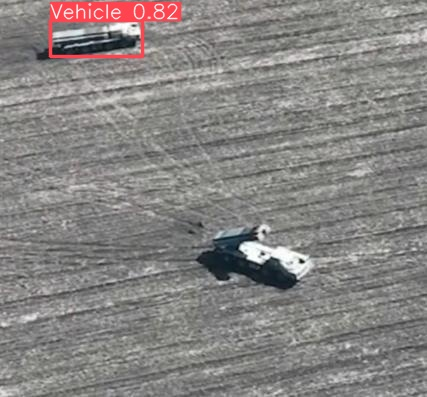

In [ ]:

#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/runs/detect/predict/image_s3r2_kiit_176.jpeg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Multiple Image detection

In [ ]:
# !yolo detect predict --weights /content/drive/MyDrive/MLR/S3R2-KIIT4/weights/best.pt --source /content/drive/MyDrive/MLR/test_images --img 640 --conf 0.25 --save-txt --save-conf --device 0
# !yolo detect predict model=/content/drive/MyDrive/MLR/S3R2-KIIT4/weights/best.pt source=/content/drive/MyDrive/MLR/test_images imgsz=640 conf=0.25 save_txt=True save_conf=True device=0
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.50 source=/content/drive/MyDrive/MLR/test_images save=True

Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs

image 1/11 /content/drive/MyDrive/MLR/test_images/M. Launcher.jpeg: 640x544 1 M. Rocket Launcher, 1 Soldier, 65.3ms
image 2/11 /content/drive/MyDrive/MLR/test_images/Missile_1.jpeg: 640x640 1 Missile, 17.1ms
image 3/11 /content/drive/MyDrive/MLR/test_images/Radar.jpeg: 480x640 1 Radar, 37.6ms
image 4/11 /content/drive/MyDrive/MLR/test_images/artilary.jpeg: 512x640 1 Artilary, 1 Soldier, 37.6ms
image 5/11 /content/drive/MyDrive/MLR/test_images/m_rock_launch.jpeg: 416x640 1 M. Rocket Launcher, 39.1ms
image 6/11 /content/drive/MyDrive/MLR/test_images/missile_2.jpeg: 576x640 1 Missile, 42.9ms
image 7/11 /content/drive/MyDrive/MLR/test_images/radar_1.jpeg: 640x544 1 Radar, 16.4ms
image 8/11 /content/drive/MyDrive/MLR/test_images/soldier2.jpeg: 640x640 2 Soldiers, 17.0ms
image 9/11 /content/drive/MyDrive/MLR/test_images/so

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.50 iou=0.45 source=/content/drive/MyDrive/MLR/test_images save=True


Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,128,293 parameters, 0 gradients, 28.5 GFLOPs

image 1/11 /content/drive/MyDrive/MLR/test_images/M. Launcher.jpeg: 640x544 1 M. Rocket Launcher, 1 Soldier, 62.8ms
image 2/11 /content/drive/MyDrive/MLR/test_images/Missile_1.jpeg: 640x640 1 Missile, 17.8ms
image 3/11 /content/drive/MyDrive/MLR/test_images/Radar.jpeg: 480x640 1 Radar, 62.7ms
image 4/11 /content/drive/MyDrive/MLR/test_images/artilary.jpeg: 512x640 1 Artilary, 1 Soldier, 63.8ms
image 5/11 /content/drive/MyDrive/MLR/test_images/m_rock_launch.jpeg: 416x640 1 M. Rocket Launcher, 67.2ms
image 6/11 /content/drive/MyDrive/MLR/test_images/missile_2.jpeg: 576x640 1 Missile, 70.0ms
image 7/11 /content/drive/MyDrive/MLR/test_images/radar_1.jpeg: 640x544 1 Radar, 16.9ms
image 8/11 /content/drive/MyDrive/MLR/test_images/soldier2.jpeg: 640x640 2 Soldiers, 17.3ms
image 9/11 /content/drive/MyDrive/MLR/test_images/so

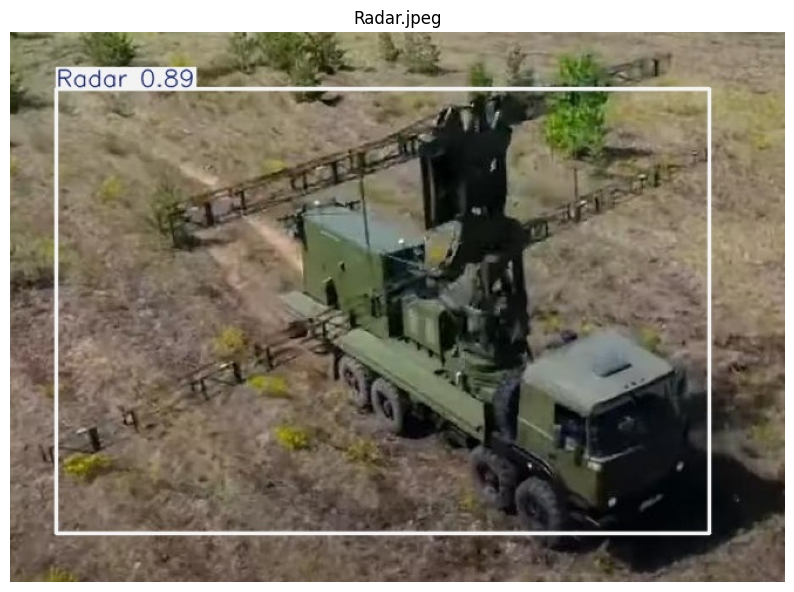

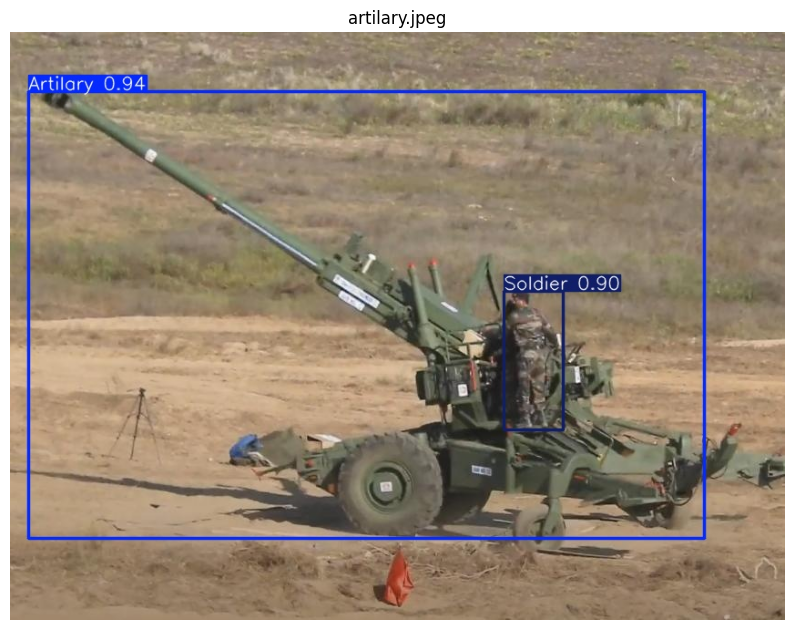

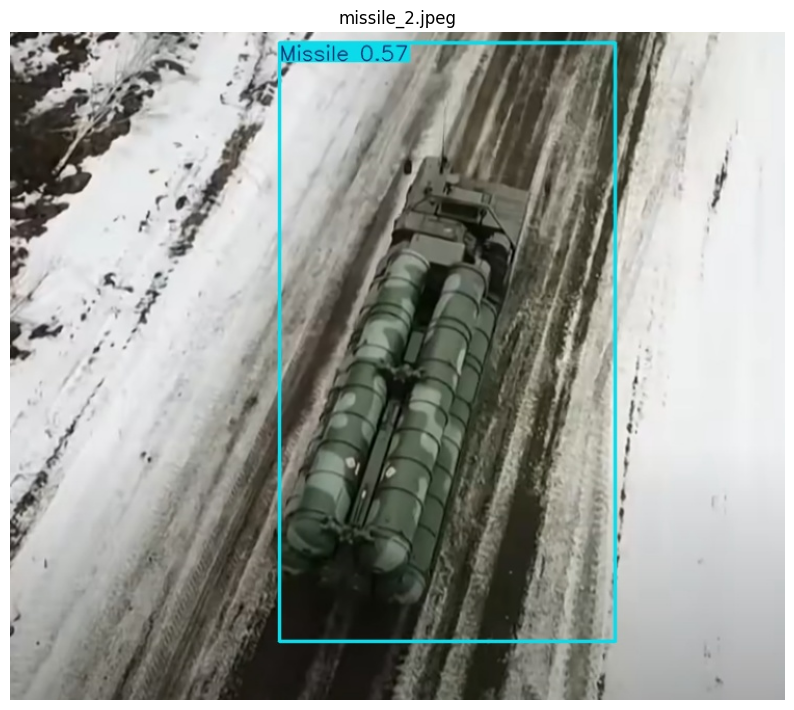

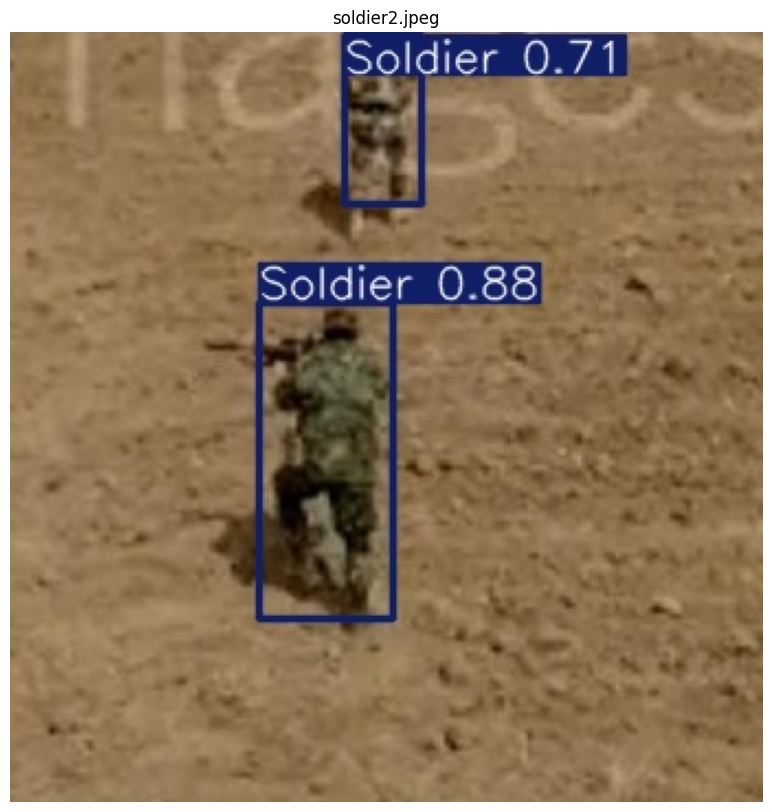

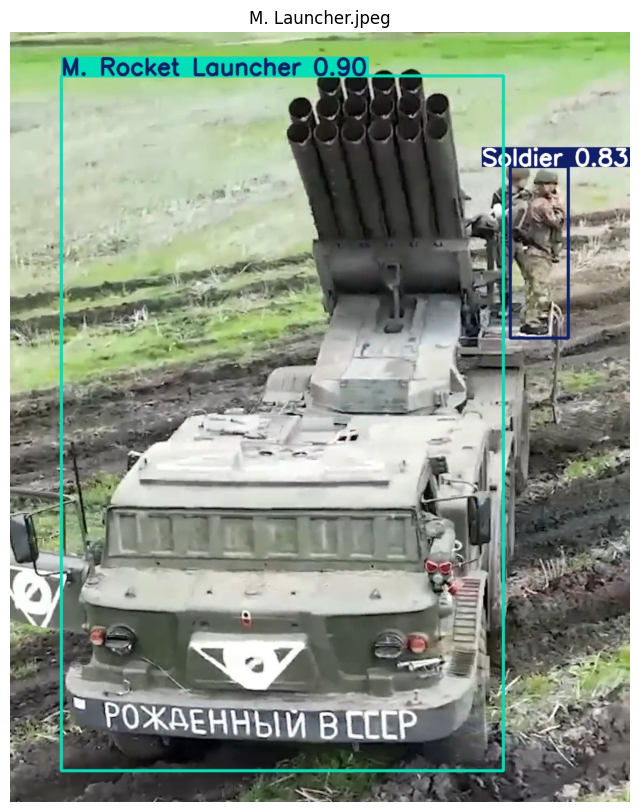

...

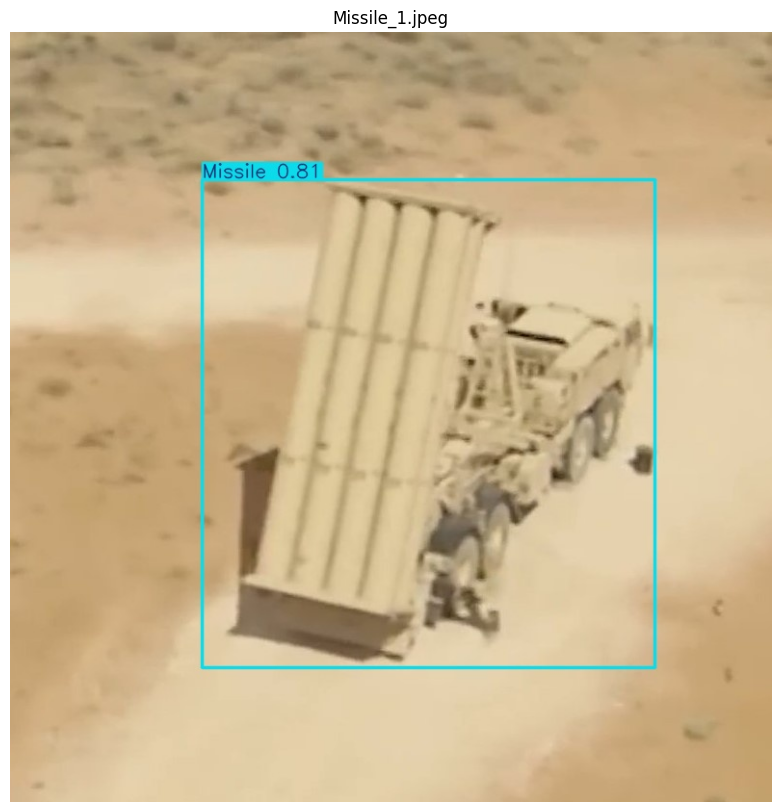

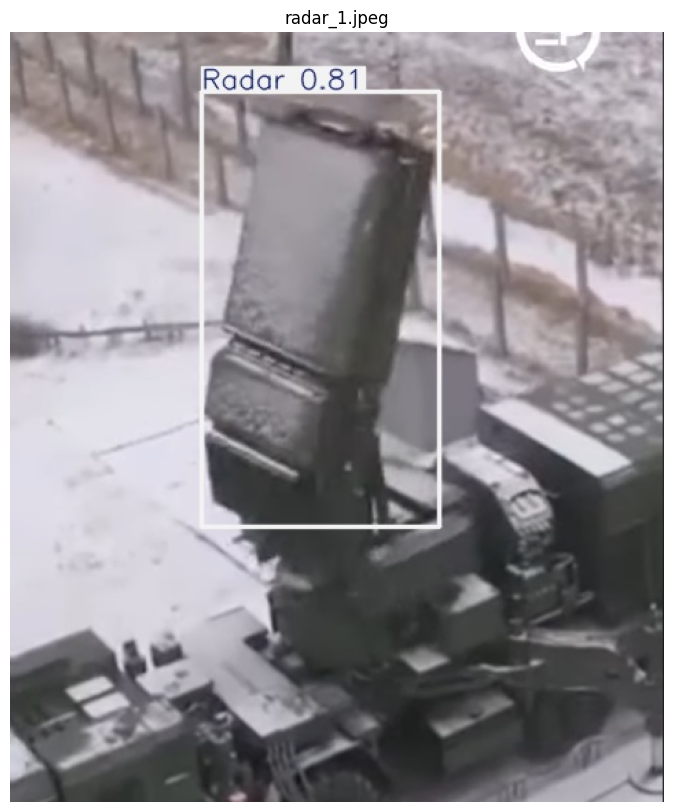

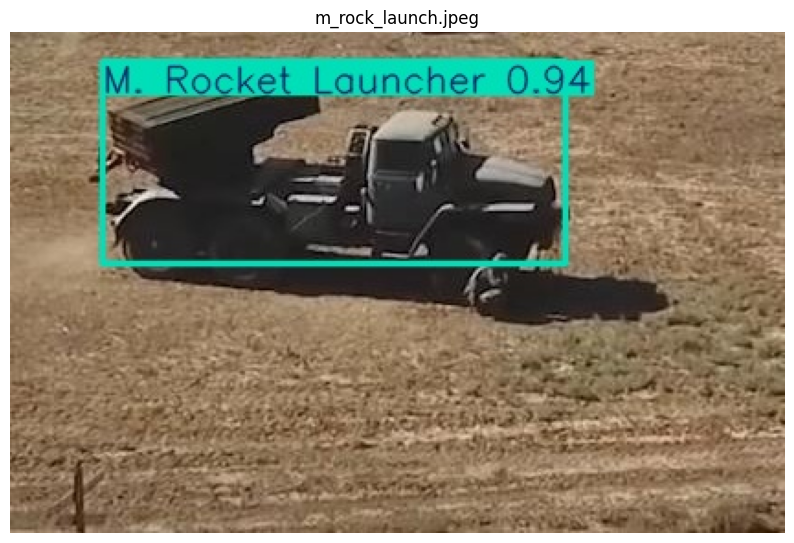

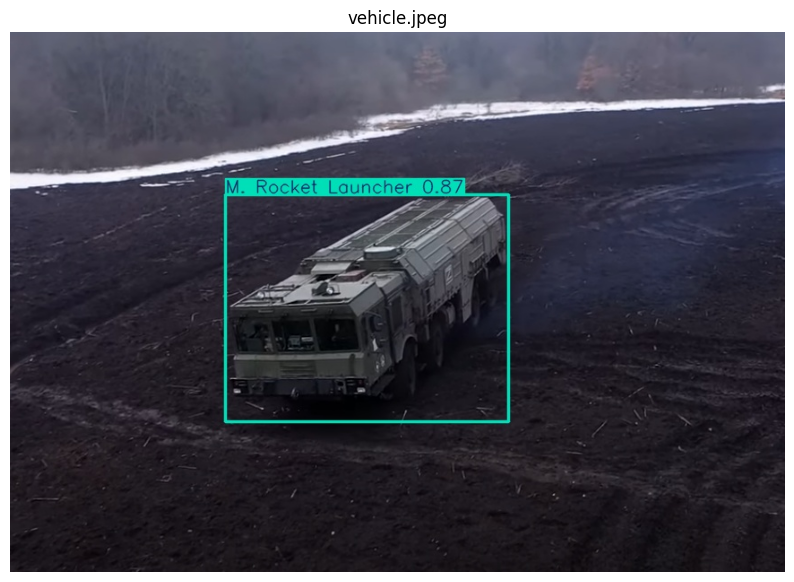

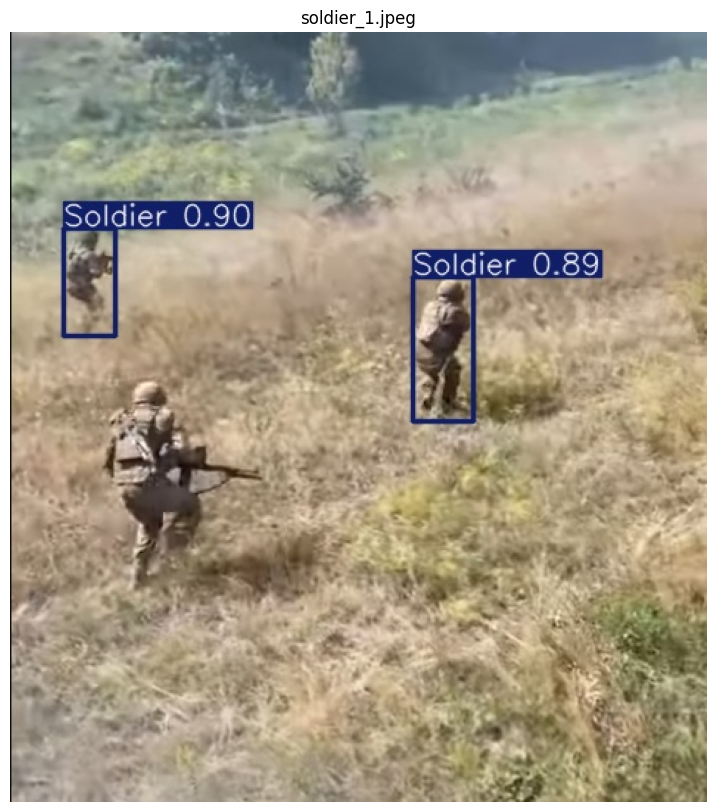

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

image_folder = 'runs/detect/predict3/'

image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.jpeg', '.webp'))]


for image_file in image_files:
    img_path = os.path.join(image_folder, image_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')
    plt.show()

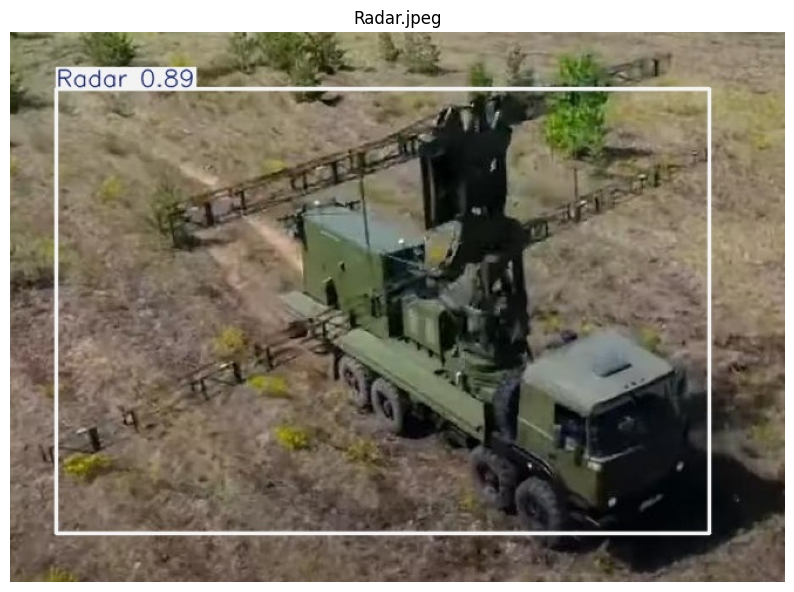

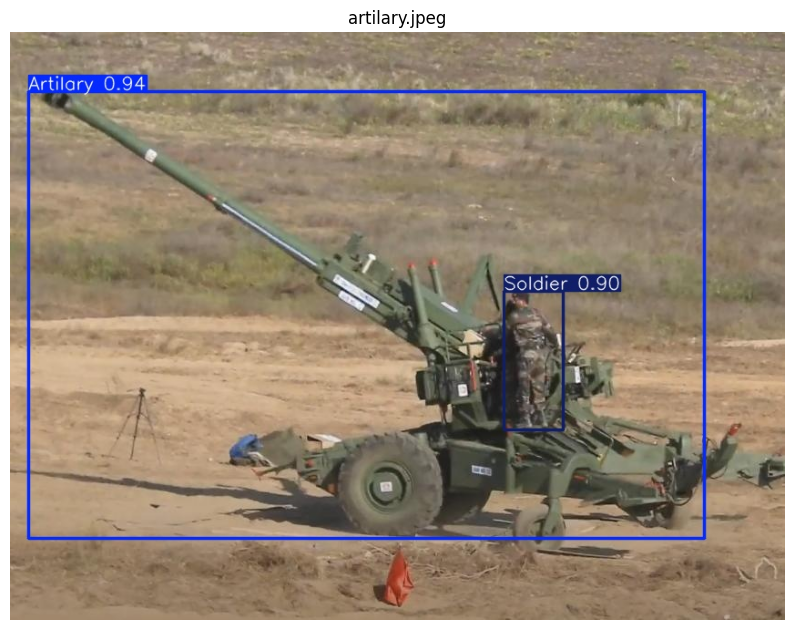

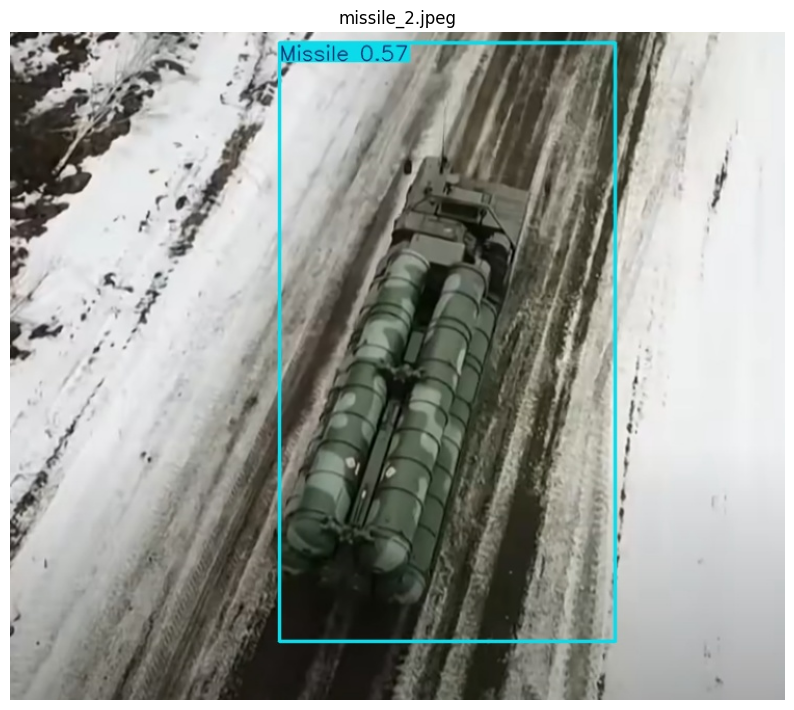

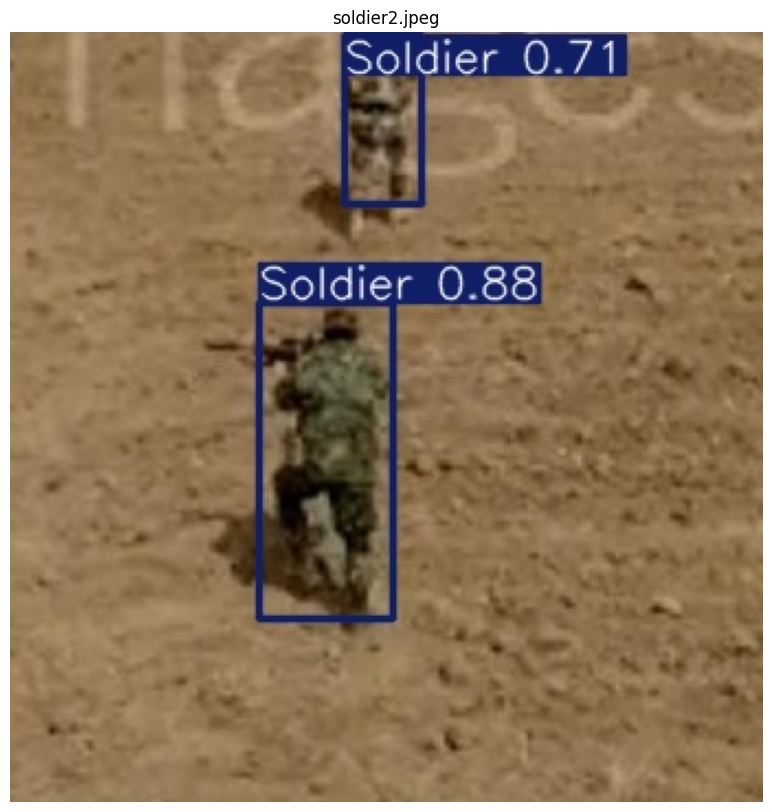

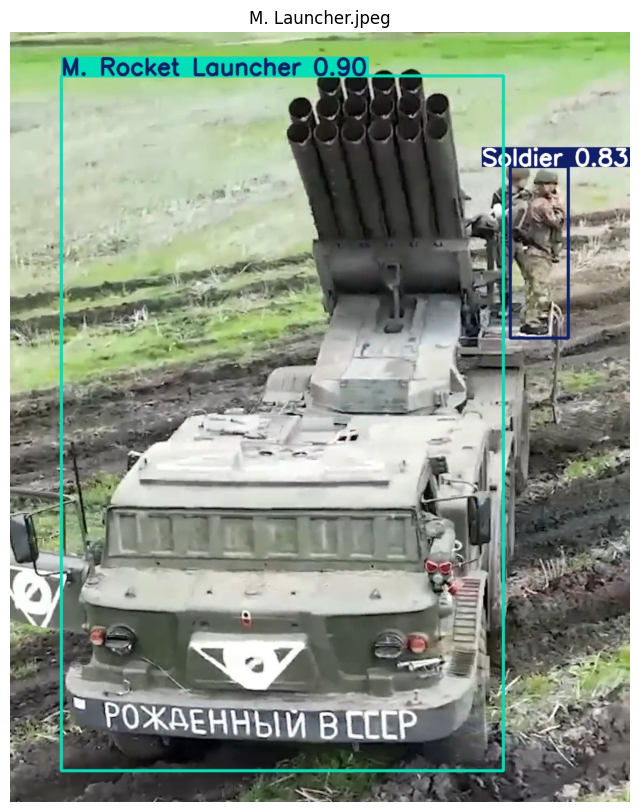

...

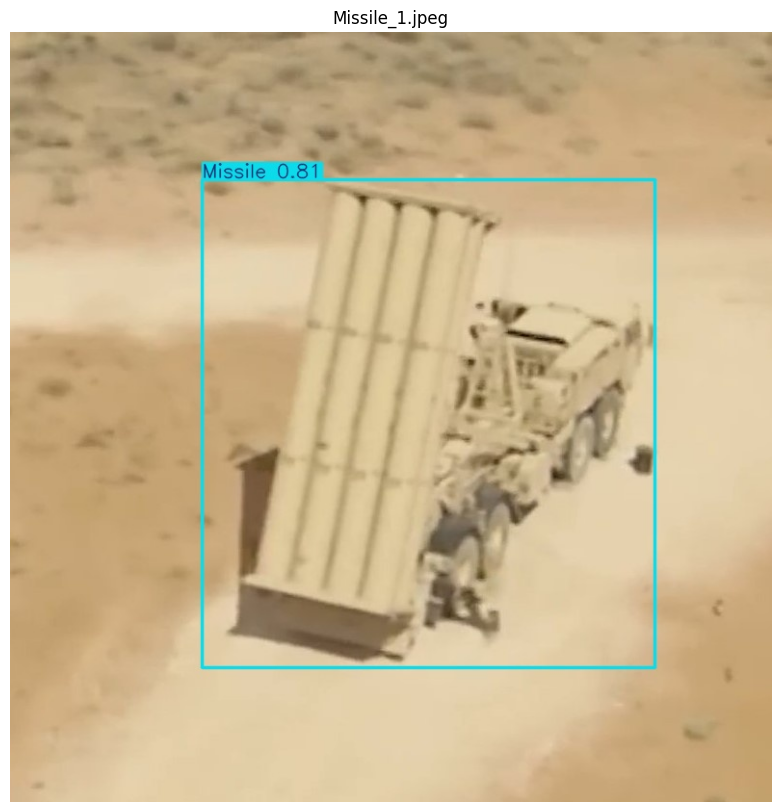

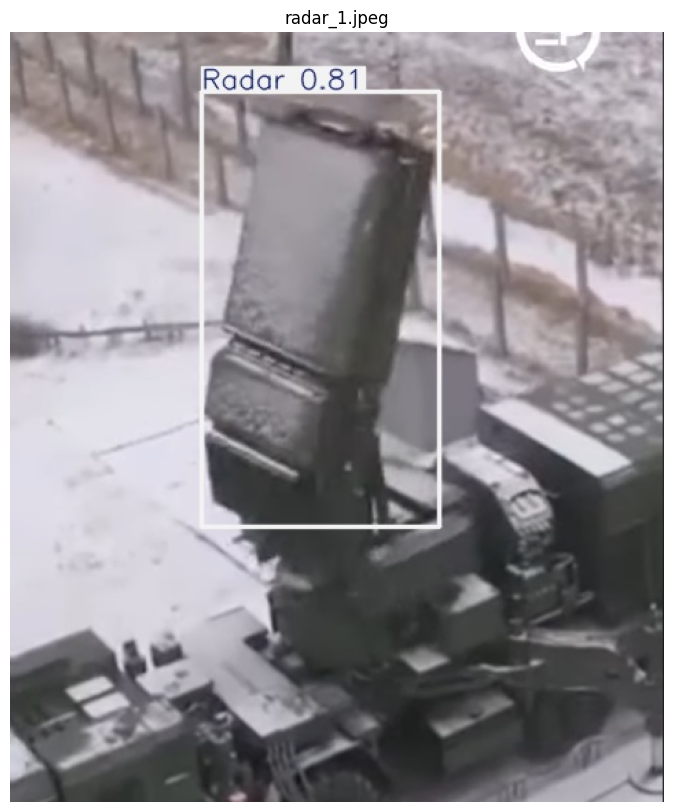

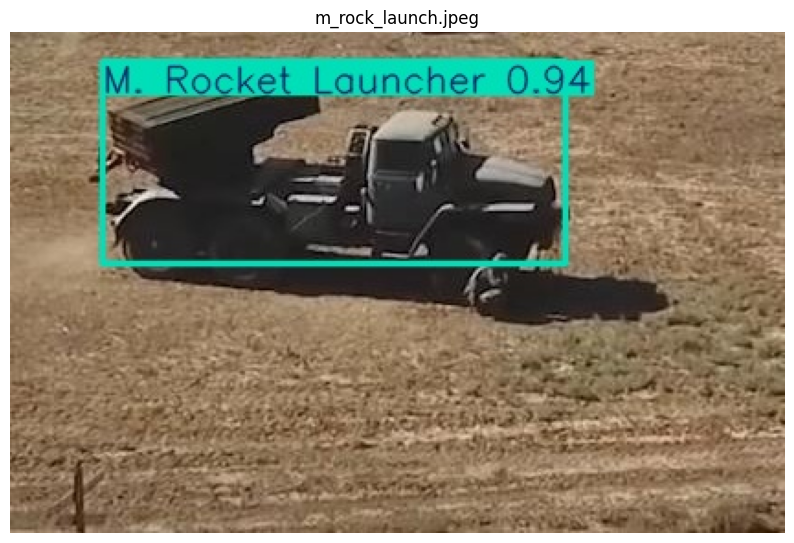

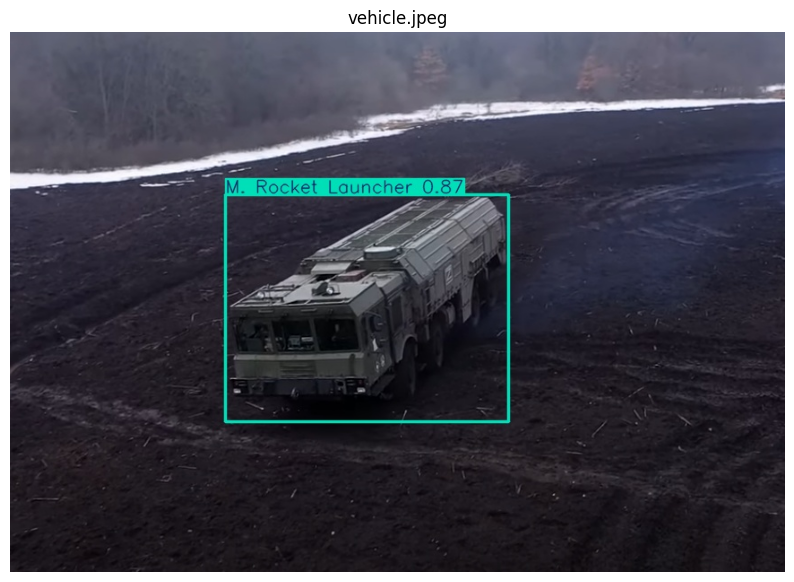

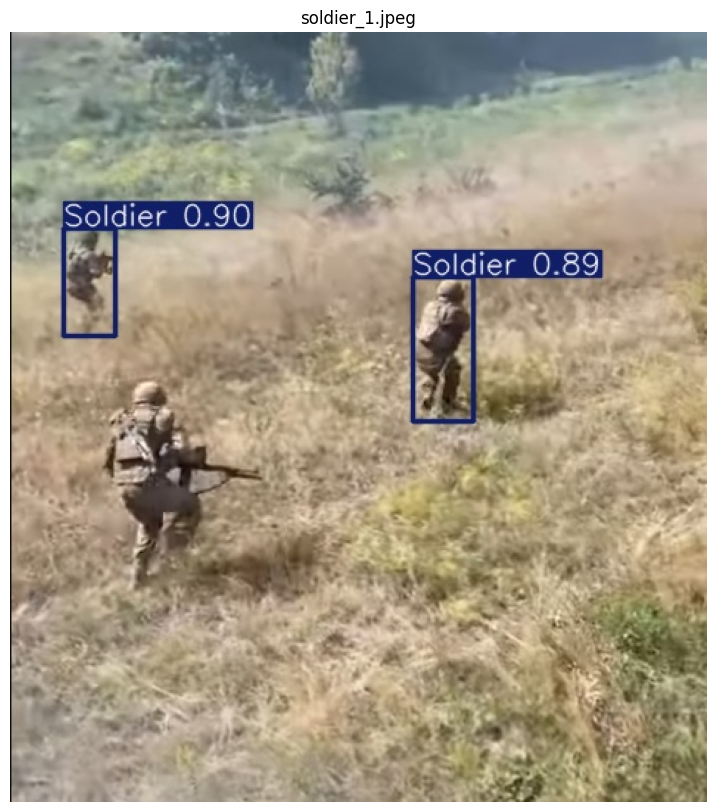

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

image_folder = 'runs/detect/predict2/'

image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.jpeg', '.webp'))]


for image_file in image_files:
    img_path = os.path.join(image_folder, image_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')
    plt.show()

# Tracking

In [ ]:
from ultralytics import YOLO

# Load your trained YOLOv8 model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Now you can use the model for detection or tracking


In [ ]:
!git clone https://github.com/ultralytics/ultralytics
%cd ultralytics
!pip install -e .


In [ ]:
!pip install yt-dlp


In [ ]:
import os

# URL of the YouTube video
video_url = 'https://www.youtube.com/watch?v=7_OappqpLFU'

# Use yt-dlp to download the video
!yt-dlp -f mp4 {video_url} -o '/content/downloaded_video8.mp4'

# Confirm the video is downloaded
if os.path.exists('/content/downloaded_video7.mp4'):
    print("Download completed! Video saved as '/content/downloaded_video5.mp4'")
else:
    print("Download failed.")


In [ ]:
!yolo track model='/content/runs/detect/train/weights/best.pt' source='/content/downloaded_video8.mp4' save=True

In [ ]:
!ffmpeg -i "/content/runs/detect/track8/downloaded_video8.avi" "/content/runs/detect/track/downloaded_video8.mp4"


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video.mp4', embed=True)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video2.mp4', embed=True)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video3.mp4', embed=True)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video4.mp4', embed=True)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video5.mp4', embed=True)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video7.mp4', embed=True)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video7.mp4', embed=True)


# Using Pretained Model

In [ ]:
!pip uninstall -y ultralytics
!pip install ultralytics


In [ ]:
from ultralytics import YOLO


In [ ]:


# Load the pre-trained YOLOv8n model
model = YOLO('/content/yolov8n.pt')

# Perform object tracking on the video
results = model.track(source='/content/downloaded_video5.mp4', save=True)

# Output will be saved in the 'runs/track' folder by default
print("Tracking complete. Results saved in:", results)


In [ ]:
from IPython.display import Video

# Display the converted video
Video('/content/runs/detect/track/downloaded_video6.mp4', embed=True)
